# Trabalho - Aprendizado Supervisionado

**Aluno:** William Humberto do Couto Becher  
**Professor:** Juliano Varela de Carvalho  
Outubro/2020

## Análise do Dataset FIFA 2019

- https://www.kaggle.com/karangadiya/fifa19

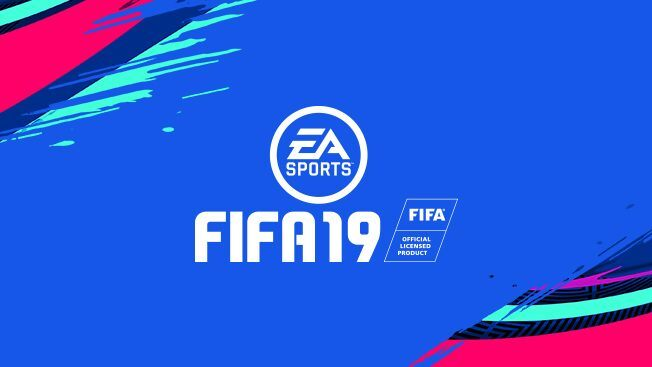

Este notebook foi criado como um trabalho de aula, da disciplina de **Aprendizado Supervisionado** do curso de **Pós-Graduação em Ciência de Dados e Machine Learning**, da **Universidade Feevale**. O Dataset utilizado foi retirado do Kaggle, no link acima. São dados detalhados dos atributos de cada jogador registrado na edição do jogo **FIFA 2019**.

No notebook encontram-se algumas visualizações para uma análise exploratória dos dados, bem como modelos de machine learning, cujo objetivo é predizer a posição na qual um jogador seria mais apto para praticar o esporte

Este dataset contém 18207 registros de jogadores, com 88 colunas de dados.

O Código utilizado para scraping está no GitHub: https://github.com/amanthedorkknight/fifa18-all-player-statistics/tree/master/2019.

Dados originais de: https://sofifa.com/

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import cufflinks as cf

import warnings

warnings.filterwarnings("ignore")
pd.set_option("max_columns", 100)
pd.set_option("max_rows", 100)
sns.set_style("whitegrid")

## Lendo os dados a partir do _.csv_

In [2]:
df = pd.read_csv(
    "data.csv", index_col=0
)  # Adicionado index_col para transformar a coluna inicial do csv em índice.
display(df.head().T)

,0,1,2,3,4
ID,158023,20801,190871,193080,192985
Name,L. Messi,Cristiano Ronaldo,Neymar Jr,De Gea,K. De Bruyne
Age,31,33,26,27,27
Photo,https://cdn.sofifa.org/players/4/19/158023.png,https://cdn.sofifa.org/players/4/19/20801.png,https://cdn.sofifa.org/players/4/19/190871.png,https://cdn.sofifa.org/players/4/19/193080.png,https://cdn.sofifa.org/players/4/19/192985.png
Nationality,Argentina,Portugal,Brazil,Spain,Belgium
Flag,https://cdn.sofifa.org/flags/52.png,https://cdn.sofifa.org/flags/38.png,https://cdn.sofifa.org/flags/54.png,https://cdn.sofifa.org/flags/45.png,https://cdn.sofifa.org/flags/7.png
Overall,94,94,92,91,91
Potential,94,94,93,93,92
Club,FC Barcelona,Juventus,Paris Saint-Germain,Manchester United,Manchester City
Club Logo,https://cdn.sofifa.org/teams/2/light/241.png,https://cdn.sofifa.org/teams/2/light/45.png,https://cdn.sofifa.org/teams/2/light/73.png,https://cdn.sofifa.org/teams/2/light/11.png,https://cdn.sofifa.org/teams/2/light/10.png


## Verificando as colunas que temos disponíveis

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18207 entries, 0 to 18206
Data columns (total 88 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        18207 non-null  int64  
 1   Name                      18207 non-null  object 
 2   Age                       18207 non-null  int64  
 3   Photo                     18207 non-null  object 
 4   Nationality               18207 non-null  object 
 5   Flag                      18207 non-null  object 
 6   Overall                   18207 non-null  int64  
 7   Potential                 18207 non-null  int64  
 8   Club                      17966 non-null  object 
 9   Club Logo                 18207 non-null  object 
 10  Value                     18207 non-null  object 
 11  Wage                      18207 non-null  object 
 12  Special                   18207 non-null  int64  
 13  Preferred Foot            18159 non-null  object 
 14  Intern

In [4]:
df.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,214298.338606,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,49.734181,45.550911,52.298144,58.686712,42.909026,55.371001,47.170824,42.863153,52.711933,58.369459,64.614076,64.726967,63.503607,61.836610,63.966573,55.460047,65.089432,63.219946,65.311967,47.109973,55.868991,46.698276,49.958478,53.400903,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,29965.244204,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,18.364524,19.525820,17.379909,14.699495,17.694408,18.910371,18.395264,17.478763,15.327870,16.686595,14.927780,14.649953,14.766049,9.010464,14.136166,17.237958,11.820044,15.894741,12.557000,19.260524,17.367967,20.696909,19.529036,14.146881,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,16.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,5.000000,2.000000,4.000000,7.000000,4.000000,4.000000,6.000000,3.000000,9.000000,5.000000,12.000000,12.000000,14.000000,21.000000,16.000000,2.000000,15.000000,12.000000,17.000000,3.000000,11.000000,3.000000,2.000000,10.000000,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,200315.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,38.000000,30.000000,44.000000,54.000000,30.000000,49.000000,34.000000,31.000000,43.000000,54.000000,57.000000,57.000000,55.000000,56.000000,56.000000,45.000000,58.000000,56.000000,58.000000,33.000000,44.000000,26.000000,38.000000,44.000000,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,221759.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,48.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,67.000000,51.000000,59.000000,52.000000,55.000000,55.000000,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,236529.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,64.000000,62.000000,64.000000,68.000000,57.000000,68.000000,62.000000,57.000000,64.000000,69.000000,75.000000,75.000000,74.000000,68.000000,74.000000,68.000000,73.000000,74.000000,74.000000,62.000000,69.000000,64.000000,64.000000,64.000000,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,246620.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,93.000000,95.000000,94.000000,93.000000,90.000000,97.000000,94.000000,94.000000,93.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,96.000000,97.000000,94.000000,95.000000,92.000000,95.000000,94.000000,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.

In [5]:
df.columns

Index(['ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag', 'Overall',
       'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiv

In [6]:
categoricas = df.select_dtypes(include=object).columns
numericas = df.select_dtypes(exclude=object).columns

print("Colunas Categóricas : ", len(categoricas))
print("Colunas Numéricas   : ", len(numericas))

Colunas Categóricas :  45
Colunas Numéricas   :  43


In [7]:
categoricas

Index(['Name', 'Photo', 'Nationality', 'Flag', 'Club', 'Club Logo', 'Value',
       'Wage', 'Preferred Foot', 'Work Rate', 'Body Type', 'Real Face',
       'Position', 'Joined', 'Loaned From', 'Contract Valid Until', 'Height',
       'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM',
       'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM',
       'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Release Clause'],
      dtype='object')

In [8]:
numericas

Index(['ID', 'Age', 'Overall', 'Potential', 'Special',
       'International Reputation', 'Weak Foot', 'Skill Moves', 'Jersey Number',
       'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys',
       'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance',
       'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving',
       'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes'],
      dtype='object')

In [9]:
df[categoricas].head()

,Name,Photo,Nationality,Flag,Club,Club Logo,Value,Wage,Preferred Foot,Work Rate,Body Type,Real Face,Position,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Release Clause
0,L. Messi,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,€110.5M,€565K,Left,Medium/ Medium,Messi,Yes,RF,"Jul 1, 2004",NaN,2021,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,€226.5M
1,Cristiano Ronaldo,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,€77M,€405K,Right,High/ Low,C. Ronaldo,Yes,ST,"Jul 10, 2018",NaN,2022,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,€127.1M
2,Neymar Jr,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,€118.5M,€290K,Right,High/ Medium,Neymar,Yes,LW,"Aug 3, 2017",NaN,2022,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,€228.1M
3,De Gea,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,€72M,€260K,Right,Medium/ Medium,Lean,Yes,GK,"Jul 1, 2011",NaN,2020,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,€138.6M
4,K. De Bruyne,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,€102M,€355K,Right,High/ High,Normal,Yes,RCM,"Aug 30, 2015",NaN,2023,5'11,154lbs,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,€196.4M


In [10]:
df[numericas].head()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
0,158023,31,94,94,2202,5.0,4.0,4.0,10.0,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0
1,20801,33,94,94,2228,5.0,4.0,5.0,7.0,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0
2,190871,26,92,93,2143,5.0,5.0,5.0,10.0,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0
3,193080,27,91,93,1471,4.0,3.0,1.0,1.0,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0
4,192985,27,91,92,2281,4.0,5.0,4.0,7.0,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0


## Limpando os dados

### Removendo colunas desnecessárias

In [11]:
df.drop(
    columns=[
        "ID",
        "Photo",
        "Flag",
        "Club Logo",
        "Special",
        "Real Face",
        "Release Clause",
        "Joined",
        "Contract Valid Until",
    ],
    inplace=True,
)

In [12]:
df.head().T

,0,1,2,3,4
Name,L. Messi,Cristiano Ronaldo,Neymar Jr,De Gea,K. De Bruyne
Age,31,33,26,27,27
Nationality,Argentina,Portugal,Brazil,Spain,Belgium
Overall,94,94,92,91,91
Potential,94,94,93,93,92
Club,FC Barcelona,Juventus,Paris Saint-Germain,Manchester United,Manchester City
Value,€110.5M,€77M,€118.5M,€72M,€102M
Wage,€565K,€405K,€290K,€260K,€355K
Preferred Foot,Left,Right,Right,Right,Right
International Reputation,5,5,5,4,4


### Colunas com mais de 50% de valores nulos

In [13]:
df.isnull().sum()[df.isnull().sum() >= 9000]

Loaned From    16943
dtype: int64

Verificando registros que contém dados na coluna `Loaned From`:

In [14]:
df[["Name", "Club", "Loaned From"]][df["Loaned From"].notnull()].head()

,Name,Club,Loaned From
28,J. Rodríguez,FC Bayern München,Real Madrid
38,G. Higuaín,Milan,Juventus
91,Paulinho,Guangzhou Evergrande Taobao FC,FC Barcelona
166,Anderson Talisca,Guangzhou Evergrande Taobao FC,SL Benfica
176,M. Kovačić,Chelsea,Real Madrid


### Clube de Origem

Como essa coluna `Loaned From` apenas nos diz qual o clube origem do jogador, podemos remover, já que não importa nesse modelo.

In [15]:
# Removendo a coluna
df.drop(columns=['Loaned From'], inplace=True)

Verificando total de valores nulos em cada coluna:

In [16]:
df.isnull().sum()

Name                           0
Age                            0
Nationality                    0
Overall                        0
Potential                      0
Club                         241
Value                          0
Wage                           0
Preferred Foot                48
International Reputation      48
Weak Foot                     48
Skill Moves                   48
Work Rate                     48
Body Type                     48
Position                      60
Jersey Number                 60
Height                        48
Weight                        48
LS                          2085
ST                          2085
RS                          2085
LW                          2085
LF                          2085
CF                          2085
RF                          2085
RW                          2085
LAM                         2085
CAM                         2085
RAM                         2085
LM                          2085
LCM       

### Coluna `Club`

In [17]:
# Jogadores que não fazem parte de nenhum clube, colocando os dados como No Club
df['Club'].fillna(value='No Club', inplace=True)

### Preferred Foot

Verificando os dados que possuem a coluna `Preferred Foot` com valores nulos.

In [18]:
df[df["Preferred Foot"].isna()].head().T

,13236,13237,13238,13239,13240
Name,J. McNulty,J. Barrera,J. Stead,A. Semprini,R. Bingham
Age,33,29,35,20,24
Nationality,Scotland,Nicaragua,England,Italy,England
Overall,62,62,62,62,62
Potential,62,62,62,72,66
Club,Rochdale,Boyacá Chicó FC,Notts County,Brescia,Hamilton Academical FC
Value,€120K,€300K,€140K,€425K,€400K
Wage,€1K,€1K,€3K,€1K,€1K
Preferred Foot,NaN,NaN,NaN,NaN,NaN
International Reputation,NaN,NaN,NaN,NaN,NaN


Como diversas colunas estão nulas, vou dropar esses registros:

In [19]:
df.drop(index=df[df['Preferred Foot'].isna()].index, inplace=True)

In [20]:
df[df['Preferred Foot'].isna()].head().T

""
Name
Age
Nationality
Overall
Potential
Club
Value
Wage
Preferred Foot
International Reputation


### Jogadores sem Posição

Encontrado jogadores sem posição definida:

In [21]:
df[df['Position'].isna()]

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
5018,R. Raldes,37,Bolivia,70,70,No Club,€0,€0,Right,1.0,3.0,2.0,Medium/ Medium,Normal,NaN,NaN,5'11,172lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,36.0,72.0,56.0,19.0,41.0,32.0,51.0,33.0,57.0,47.0,46.0,59.0,66.0,58.0,74.0,58.0,53.0,75.0,47.0,74.0,65.0,26.0,48.0,77.0,64.0,79.0,70.0,70.0,16.0,8.0,11.0,12.0,13.0
6736,J. Arce,33,Bolivia,68,68,No Club,€0,€0,Left,1.0,3.0,3.0,High/ Low,Lean,NaN,NaN,5'9,154lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.0,73.0,65.0,64.0,52.0,67.0,40.0,36.0,50.0,70.0,71.0,74.0,73.0,61.0,75.0,61.0,63.0,73.0,41.0,61.0,48.0,36.0,67.0,63.0,69.0,67.0,12.0,34.0,33.0,16.0,13.0,15.0,16.0,8.0
7922,L. Gutiérrez,33,Bolivia,67,67,No Club,€0,€0,Right,1.0,3.0,2.0,Medium/ Medium,Normal,NaN,NaN,5'11,190lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0,39.0,59.0,33.0,37.0,44.0,48.0,40.0,35.0,47.0,64.0,61.0,68.0,68.0,60.0,51.0,72.0,78.0,78.0,47.0,76.0,62.0,49.0,45.0,42.0,54.0,72.0,71.0,64.0,11.0,7.0,8.0,12.0,12.0
9905,R. Vargas,23,Bolivia,66,69,No Club,€0,€0,Right,1.0,4.0,3.0,High/ Low,Normal,NaN,NaN,5'7,143lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,70.0,54.0,57.0,63.0,74.0,57.0,41.0,53.0,72.0,71.0,73.0,79.0,63.0,91.0,62.0,75.0,80.0,33.0,59.0,26.0,17.0,70.0,56.0,67.0,64.0,19.0,24.0,23.0,13.0,11.0,11.0,7.0,9.0
10628,D. Bejarano,26,Bolivia,65,66,No Club,€0,€0,Right,1.0,2.0,2.0,Medium/ Medium,Normal,NaN,NaN,5'9,154lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.0,48.0,44.0,66.0,31.0,57.0,31.0,29.0,64.0,59.0,68.0,61.0,54.0,65.0,76.0,24.0,58.0,56.0,47.0,29.0,57.0,63.0,38.0,32.0,39.0,57.0,68.0,69.0,68.0,14.0,12.0,11.0,14.0,12.0
16450,S. Paul,31,India,57,57,No Club,€0,€0,Right,1.0,3.0,1.0,Medium/ Medium,Normal,NaN,NaN,6'1,172lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,20.0,15.0,23.0,17.0,14.0,15.0,12.0,22.0,13.0,56.0,46.0,65.0,65.0,46.0,13.0,69.0,32.0,33.0,16.0,28.0,23.0,12.0,27.0,16.0,52.0,12.0,15.0,12.0,53.0,48.0,62.0,57.0,60.0
16539,L. Lalruatthara,23,India,57,63,No Club,€0,€0,Left,1.0,4.0,2.0,High/ Medium,Lean,NaN,NaN,5'11,143lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.0,33.0,47.0,28.0,31.0,51.0,32.0,34.0,24.0,44.0,78.0,82.0,70.0,53.0,74.0,24.0,56.0,54.0,47.0,29.0,52.0,58.0,49.0,37.0,38.0,57.0,60.0,61.0,57.0,15.0,12.0,11.0,6.0,12.0
16793,E. Lyngdoh,31,India,56,56,No Club,€0,€0,Right,1.0,3.0,2.0,Medium/ Medium,Lean,NaN,NaN,5'9,150lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.0,47.0,39.0,57.0,56.0,57.0,73.0,70.0,51.0,64.0,67.0,66.0,81.0,56.0,84.0,63.0,57.0,70.0,54.0,48.0,33.0,43.0,41.0,53.0,59.0,63.0,43.0,48.0,32.0,7.0,8.0,9.0,15.0,9.0
17129,J. Singh,26,India,55,58,No Club,€0,€0,Right,1.0,4.0,2.0,High/ Medium,Lean,NaN,NaN,5'7,159lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.0,51.0,40.0,50.0,45.0,46.0,48.0,59.0,35.0,53.0,86.0,82.0,77.0,51.0,80.0,68.0,53.0,66.0,59.0,52.0,32.0,12.0,49.0,40.0,65.0,42.0,26.0,18.0,13.0,15.0,14.0,8.0,10.0

In [22]:
# Dropando jogadores que não possuem registros de posição
df.drop(index=df[df['Position'].isna()].index, inplace=True)

### Nulos Restantes

Ainda verificando quantos valores nulos ainda restam

In [23]:
df.isnull().sum()[df.isnull().sum() > 0]

LS     2025
ST     2025
RS     2025
LW     2025
LF     2025
CF     2025
RF     2025
RW     2025
LAM    2025
CAM    2025
RAM    2025
LM     2025
LCM    2025
CM     2025
RCM    2025
RM     2025
LWB    2025
LDM    2025
CDM    2025
RDM    2025
RWB    2025
LB     2025
LCB    2025
CB     2025
RCB    2025
RB     2025
dtype: int64

Todas as posições possíveis estão listadas aí com a mesma quantidade de valores nulos.

Todas mesmo?

In [24]:
df[df['Position'] == 'GK']

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0
9,J. Oblak,25,Slovenia,90,93,Atlético Madrid,€68M,€94K,Right,3.0,3.0,1.0,Medium/ Medium,Normal,GK,1.0,6'2,192lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,11.0,15.0,29.0,13.0,12.0,13.0,14.0,26.0,16.0,43.0,60.0,67.0,86.0,49.0,22.0,76.0,41.0,78.0,12.0,34.0,19.0,11.0,70.0,11.0,70.0,27.0,12.0,18.0,86.0,92.0,78.0,88.0,89.0
18,M. ter Stegen,26,Germany,89,92,FC Barcelona,€58M,€240K,Right,3.0,4.0,1.0,Medium/ Medium,Normal,GK,22.0,6'2,187lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,14.0,11.0,36.0,14.0,17.0,18.0,12.0,42.0,18.0,38.0,50.0,37.0,85.0,43.0,22.0,79.0,35.0,79.0,10.0,43.0,22.0,11.0,69.0,25.0,69.0,25.0,13.0,10.0,87.0,85.0,88.0,85.0,90.0
19,T. Courtois,26,Belgium,89,90,Real Madrid,€53.5M,€240K,Left,4.0,2.0,1.0,Medium/ Medium,Courtois,GK,1.0,6'6,212lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,13.0,33.0,12.0,13.0,19.0,20.0,35.0,23.0,46.0,52.0,61.0,84.0,45.0,36.0,68.0,38.0,70.0,17.0,23.0,15.0,13.0,44.0,27.0,66.0,20.0,18.0,16.0,85.0,91.0,72.0,86.0,88.0
22,M. Neuer,32,Germany,89,89,FC Bayern München,€38M,€130K,Right,5.0,4.0,1.0,Medium/ Medium,Normal,GK,1.0,6'4,203lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,13.0,25.0,55.0,11.0,30.0,14.0,11.0,59.0,48.0,54.0,60.0,51.0,84.0,35.0,25.0,77.0,43.0,80.0,16.0,29.0,30.0,12.0,70.0,47.0,70.0,17.0,10.0,11.0,90.0,86.0,91.0,87.0,87.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18178,L. Wahlstedt,18,Sweden,48,65,Dalkurd FF,€50K,€1K,Right,1.0,2.0,1.0,Medium/ Medium,Lean,GK,30.0,6'0,176lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,7.0,11.0,22.0,6.0,8.0,10.0,8.0,20.0,12.0,24.0,28.0,33.0,40.0,29.0,15.0,48.0,20.0,38.0,6.0,20.0,10.0,7.0,18.0,12.0,28.0,16.0,11.0,10.0,47.0,46.0,50.0,45.0,51.0
18180,M. Hurst,22,Scotland,48,58,St. Johnstone FC,€40K,€1K,Right,1.0,2.0,1.0,Medium/ Medium,Lean,GK,30.0,6'1,172lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.0,15.0,15.0,26.0,14.0,13.0,12.0,19.0,19.0,25.0,40.0,42.0,45.0,47.0,52.0,25.0,55.0,33.0,58.0,20.0,20.0,29.0,13.0,20.0,29.0,28.0,12.0,15.0,16.0,45.0,49.0,50.0,50.0,45.0
18183,K. Pilkington,44,England,48,48,Cambridge United,€0,€1K,Right,1.0,2.0,1.0,Medium/ Medium,Normal,GK,44.0,6'2,190lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,12.0,12.0,18.0,11.0,11.0,12.0,13.0,13.0,16.0,15.0,17.0,31.0,48.0,31.0,23.0,45.0,22.0,44.0,12.0,24.0,15.0,10.0,11.0,22.0,

Todos os valores nulos restantes são os valores das posições de dos registros de goleiros. Que não podem ser removidos, pois perderíamos estes dados, e não poderíamos analisar corretamente os depois.

Nesse caso, os valores nulos, virarão `0`.

In [25]:
df.fillna(value=0, inplace=True)

In [26]:
# Total de Valores Nulos no DataFrame
df.isnull().sum().sum()

0

Agora sim, nenhuma coluna mais possui valores nulos.

## Conversão de Dados

Conversão dos valores de salários, para remover as letras, e transformar em float.

### Salário: 150k > 150000

In [27]:
def conversor_de_salario(val):
    """
    Converte o salário de String para Número.
    Ex:
       €72M   --> 72000000
       €260K  -->   260000
    """
    if val[-1] == "M":
        val = val[1:-1]
        val = float(val) * 1000000
        return val

    elif val[-1] == "K":
        val = val[1:-1]
        val = float(val) * 1000
        return val

    else:
        return 0

In [28]:
df['Valor em Libras'] = df['Value'].apply(conversor_de_salario)
df['Salario em Libras'] = df['Wage'].apply(conversor_de_salario)

df.drop(columns=['Value', 'Wage'], inplace=True)

df.head()

,Name,Age,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Valor em Libras,Salario em Libras
0,L. Messi,31,Argentina,94,94,FC Barcelona,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,110500000.0,565000.0
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,77000000.0,405000.0
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,118500000.0,290000.0
3,De Gea,27,Spain,91,93,Manchester United,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,6'4,168lbs,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,72000000.0,260000.0
4,K. De Bruyne,27,Belgium,91,92,Manchester City,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,5'11,154lbs,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,102000000.0,355000.0


### Valores de Posições: 90+3 > 93

Todos os valores de Posições são registradas com XX+X. Converti para int.

In [29]:
colunas_habilidades_linha = ['LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM',
       'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM',
       'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB']

df[colunas_habilidades_linha].head()

,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2
1,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3


In [30]:
# Função para converter as habilidades no formato XX+X para um Inteiro


def conversor_habilidades(val):
    """
    Converte valores de habilidades:
    Ex:
       88+2 --> 90
    """
    if type(val) == str:
        s1 = val[0:2]
        s2 = val[-1]
        val = int(s1) + int(s2)
        return val

    else:
        return val

In [31]:
for col in colunas_habilidades_linha:
    df[col] = df[col].apply(conversor_habilidades)

In [32]:
df[colunas_habilidades_linha].head()

,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,90,90,90,94,95,95,95,94,95,95,95,93,86,86,86,93,66,63,63,63,66,61,49,49,49,61
1,94,94,94,92,93,93,93,92,91,91,91,91,84,84,84,91,68,64,64,64,68,64,56,56,56,64
2,87,87,87,92,92,92,92,92,92,92,92,91,84,84,84,91,68,63,63,63,68,63,50,50,50,63
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,85,85,85,90,90,90,90,90,91,91,91,91,90,90,90,91,80,80,80,80,80,76,69,69,69,76


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18147 entries, 0 to 18206
Data columns (total 78 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      18147 non-null  object 
 1   Age                       18147 non-null  int64  
 2   Nationality               18147 non-null  object 
 3   Overall                   18147 non-null  int64  
 4   Potential                 18147 non-null  int64  
 5   Club                      18147 non-null  object 
 6   Preferred Foot            18147 non-null  object 
 7   International Reputation  18147 non-null  float64
 8   Weak Foot                 18147 non-null  float64
 9   Skill Moves               18147 non-null  float64
 10  Work Rate                 18147 non-null  object 
 11  Body Type                 18147 non-null  object 
 12  Position                  18147 non-null  object 
 13  Jersey Number             18147 non-null  float64
 14  Height

### Altura e Peso

Os valores de altura e peso estão em Pés e Libras. Necessário fazer a conversão, para poder utilizar nos gráficos e cálculos.

In [34]:
df[['Height', 'Weight']].head()

,Height,Weight
0,5'7,159lbs
1,6'2,183lbs
2,5'9,150lbs
3,6'4,168lbs
4,5'11,154lbs


In [35]:
def conversor_altura(val):
    f = val.split("'")[0]
    i = val.split("'")[1]
    h = (int(f) * 30.48) + (int(i) * 2.54)
    return h


def conversor_peso(val):
    w = int(val.split("lbs")[0]) * 0.453592
    return w

In [36]:
df['Height'] = df['Height'].apply(conversor_altura)
df['Weight'] = df['Weight'].apply(conversor_peso)

df[['Height', 'Weight']].head()

,Height,Weight
0,170.18,72.121128
1,187.96,83.007336
2,175.26,68.038800
3,193.04,76.203456
4,180.34,69.853168


### Work Rate

Para as colunas Work Rate, Body Type, o Dataset possui alguns valores com nomes de jogadores, para esses casos, alterei o conteúdo da coluna para o padrão: Esguio, Normal, Atarracado.

In [37]:
df['Work Rate'].unique()

array(['Medium/ Medium', 'High/ Low', 'High/ Medium', 'High/ High',
       'Medium/ High', 'Medium/ Low', 'Low/ High', 'Low/ Medium',
       'Low/ Low'], dtype=object)

### Body Type

In [38]:
df['Body Type'].unique()

array(['Messi', 'C. Ronaldo', 'Neymar', 'Lean', 'Normal', 'Courtois',
       'Stocky', 'PLAYER_BODY_TYPE_25', 'Shaqiri', 'Akinfenwa'],
      dtype=object)

In [39]:
df["Body Type"][df["Body Type"] == "Messi"] = "Esguio"
df["Body Type"][df["Body Type"] == "C. Ronaldo"] = "Normal"
df["Body Type"][df["Body Type"] == "Neymar"] = "Esguio"
df["Body Type"][df["Body Type"] == "Courtois"] = "Esguio"
# PLAYER_BODY_TYPE_25 is the body type of Mohammed Salah who has a Normal body type.
df["Body Type"][df["Body Type"] == "PLAYER_BODY_TYPE_25"] = "Normal"
df["Body Type"][df["Body Type"] == "Shaqiri"] = "Atarracado"
df["Body Type"][df["Body Type"] == "Akinfenwa"] = "Atarracado"
df["Body Type"][df["Body Type"] == "Lean"] = "Esguio"
df["Body Type"][df["Body Type"] == "Stocky"] = "Atarracado"

In [40]:
df['Body Type'].unique()

array(['Esguio', 'Normal', 'Atarracado'], dtype=object)

In [41]:
df.head().T

,0,1,2,3,4
Name,L. Messi,Cristiano Ronaldo,Neymar Jr,De Gea,K. De Bruyne
Age,31,33,26,27,27
Nationality,Argentina,Portugal,Brazil,Spain,Belgium
Overall,94,94,92,91,91
Potential,94,94,93,93,92
Club,FC Barcelona,Juventus,Paris Saint-Germain,Manchester United,Manchester City
Preferred Foot,Left,Right,Right,Right,Right
International Reputation,5,5,5,4,4
Weak Foot,4,4,5,3,5
Skill Moves,4,5,5,1,4


### Posições possíveis: 27 > 4

Verificando todas as posições possíveis

In [42]:
print('Quantidade de Posições :', df['Position'].nunique())
print('Posições Possíveis     :', df['Position'].unique())

Quantidade de Posições : 27
Posições Possíveis     : ['RF' 'ST' 'LW' 'GK' 'RCM' 'LF' 'RS' 'RCB' 'LCM' 'CB' 'LDM' 'CAM' 'CDM'
 'LS' 'LCB' 'RM' 'LAM' 'LM' 'LB' 'RDM' 'RW' 'CM' 'RB' 'RAM' 'CF' 'RWB'
 'LWB']


In [43]:
def simplificador_posicoes(val):
    """
    Simplifica a quantidade de posições.
    Utilizaremos apenas as 4 opções:
        GK - Goleiro
        D  - Defensor
        M  - Meio Campo
        F  - Atacante
    """
    if val in ['RF', 'ST', 'LF', 'RS', 'LS', 'CF']:
        val = 'F'
        return val
    elif val in ['LW', 'RCM', 'LCM', 'LDM', 'CAM', 'CDM', 'RM', 'LAM', 'LM', 'RDM', 'RW', 'CM', 'RAM']:
        val = 'M'
        return val
    elif val in ['RCB', 'CB', 'LCB', 'LB', 'RB', 'RWB', 'LWB']:
        val = 'D'
        return val
    else:
        return val

In [44]:
df['Position'] = df['Position'].apply(simplificador_posicoes)
df['Position'].value_counts()

M     7589
D     5866
F     2667
GK    2025
Name: Position, dtype: int64

In [45]:
colunas_predicao = ['Age', 'Nationality', 'Overall', 'Potential', 'Preferred Foot', 'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate', 'Body Type', 'Position', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes', 'Valor em Libras', 'Salario em Libras', 'Height', 'Weight']
df[colunas_predicao]

,Age,Nationality,Overall,Potential,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Valor em Libras,Salario em Libras,Height,Weight
0,31,Argentina,94,94,Left,5.0,4.0,4.0,Medium/ Medium,Esguio,F,90,90,90,94,95,95,95,94,95,95,95,93,86,86,86,93,66,63,63,63,66,61,49,49,49,61,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,110500000.0,565000.0,170.18,72.121128
1,33,Portugal,94,94,Right,5.0,4.0,5.0,High/ Low,Normal,F,94,94,94,92,93,93,93,92,91,91,91,91,84,84,84,91,68,64,64,64,68,64,56,56,56,64,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,77000000.0,405000.0,187.96,83.007336
2,26,Brazil,92,93,Right,5.0,5.0,5.0,High/ Medium,Esguio,M,87,87,87,92,92,92,92,92,92,92,92,91,84,84,84,91,68,63,63,63,68,63,50,50,50,63,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,118500000.0,290000.0,175.26,68.038800
3,27,Spain,91,93,Right,4.0,3.0,1.0,Medium/ Medium,Esguio,GK,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,72000000.0,260000.0,193.04,76.203456
4,27,Belgium,91,92,Right,4.0,5.0,4.0,High/ High,Normal,M,85,85,85,90,90,90,90,90,91,91,91,91,90,90,90,91,80,80,80,80,80,76,69,69,69,76,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,102000000.0,355000.0,180.34,69.853168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18202,19,England,47,65,Right,1.0,2.0,2.0,Medium/ Medium,Esguio,M,44,44,44,46,46,46,46,46,47,47,47,46,47,47,47,46,46,47,47,47,46,47,47,47,47,47,34.0,38.0,40.0,49.0,25.0,42.0,30.0,34.0,45.0,43.0,54.0,57.0,60.0,49.0,76.0,43.0,55.0,40.0,47.0,38.0,46.0,46.0,39.0,52.0,43.0,45.0,40.0,48.0,47.0,10.0,13.0,7.0,8.0,9.0,60000.0,1000.0,175.26,60.781328
18203,19,Sweden,47,63,Right,1.0,2.0,2.0,Medium/ Medium,Normal,F,47,47,47,41,44,44,44,41,42,42,42,40,37,37,37,40,32,33,33,33,32,31,34,34,34,31,23.0,52.0,52.0,43.0,36.0,39.0,32.0,20.0,25.0,40.0,41.0,39.0,38.0,40.0,52.0,41.0,47.0,43.0,67.0,42.0,47.0,16.0,46.0,33.0,43.0,42.0,22.0,15.0,19.0,10.0,9.0,9.0,5.0,12.0,60000.0,1000.0,190.50,77.110640
18204,16,England,47,67,Right,1.0,3.0,2.0,Medium/ Medium,Normal,F,47,47,47,47,48,48,48,47,46,46,46,46,40,40,40,46,36,32,32,32,36,35,30,30,30,35,25.0,40.0,46.0,38.0,38.0,45.0,38.0,27.0,28.0,44.0,70.0,69.0,50.0,47.0,58.0,45.0,60.0,55.0,32.0,45.0,32.0,15.0,48.0,43.0,55.0,41.0,32.0,13.0,11.0,6.0,5.0,10.0,6.0,13.0,60000.0,1000.0,172.72,67.131616
18205,17,England,47,66,Right,1.0,3.0,2.0,Medium/ Medium,Esguio,M,49,49,49,49,48,48,48,49,47,47,47,48,41,41,41,48,38,34,34,34,38,37,33,33,33,37,44.0,50.0,39.0,42.0,40.0,51.0,34.0,32.0,32.0,52.0,61.0,60.0,52.0,21.0,71.0,64.0,42.0,40.0,48.0,34.0,33.0,22.0,44.0,47.0,50.0,46.0,20.0,25.0,27.0,14.0,6.0,14.0,8.0,9.0,60000.0,1000.0,177.80,69.853168


## Análise Exploratória e Visualizações

### Histograma de Salários

No histograma abaixo, podemos ver que a maioria dos salários (17959) fica abaixo de 100 mil libras.

In [46]:
salarios1 = go.Histogram(x=df["Salario em Libras"], nbinsx=20, opacity=0.7)

layout_salarios = go.Layout(
    title="<b>Salários em Libras<b>",
    xaxis=dict(title="<b><i>Salário</b></i>"),
    yaxis=dict(title="<b><i>Quantidade</b></i>"),
)

fig = go.Figure(data=[salarios1], layout=layout_salarios)
py.iplot(fig)

### Scatter Salário x Idade x Pé

In [47]:
fig = px.scatter(df, x="Salario em Libras", y="Age", color="Preferred Foot",
#                  size='petal_length', 
                 hover_data=['Name', 'Salario em Libras'])
fig.show()

### Scatter Salario x Overall x Potential

In [48]:
fig = px.scatter(
    df,
    x="Salario em Libras",
    y="Overall",
    color="Potential",
    hover_data=["Name", "Salario em Libras"],
)
fig.show()

### Histograma de Idades

As idades concentram-se entre 18 e 31 anos.

In [49]:
idades1 = go.Histogram(x=df["Age"], nbinsx=50, opacity=0.7)

layout_idades = go.Layout(
    title="<b>Histograma de Idade<b>",
    xaxis=dict(title="<b><i>Idade</b></i>"),
    yaxis=dict(title="<b><i>Quantidade</b></i>"),
)

fig = go.Figure(data=[idades1], layout=layout_idades)
py.iplot(fig)

### Histograma de Idade por posições

In [50]:
# Histograma de Idade, colorido por Posições
fig = px.histogram(df, x="Age", color="Position")
fig.show()

### Histograma do Pé Preferido x Posição

In [51]:
# Histograma de Pé Preferido, colorido por Posições
fig = px.histogram(df, x="Position", color="Preferred Foot")
fig.show()

In [52]:
df[['Salario em Libras', 'Preferred Foot']]

,Salario em Libras,Preferred Foot
0,565000.0,Left
1,405000.0,Right
2,290000.0,Right
3,260000.0,Right
4,355000.0,Right
...,...,...
18202,1000.0,Right
18203,1000.0,Right
18204,1000.0,Right
18205,1000.0,Right


<AxesSubplot:title={'center':'Salario em Libras'}, xlabel='Preferred Foot'>

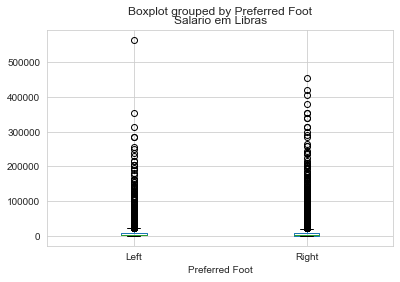

In [53]:
df.boxplot(by="Preferred Foot", column=["Salario em Libras"], grid=True)

<AxesSubplot:xlabel='Preferred Foot', ylabel='Salario em Libras'>

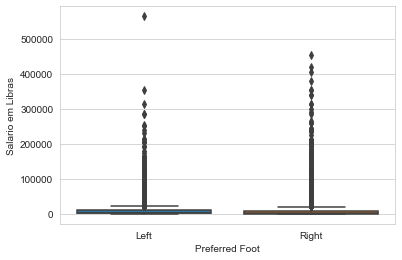

In [54]:
sns.boxplot(x="Preferred Foot", y="Salario em Libras", data=df)

In [55]:
df['Salario em Libras'].describe()

count     18147.000000
mean       9759.023530
std       22030.250349
min           0.000000
25%        1000.000000
50%        3000.000000
75%        9000.000000
max      565000.000000
Name: Salario em Libras, dtype: float64

### Histograma de Alturas

In [56]:
alturas = go.Histogram(x=df["Height"], nbinsx=12, opacity=0.7)

layout = go.Layout(
    title="<b>Altura em cm<b>",
    xaxis=dict(title="<b><i>Altura em cm</b></i>"),
    yaxis=dict(title="<b><i>Quantidade</b></i>"),
)

fig = go.Figure(data=[alturas], layout=layout)
py.iplot(fig)

### Histograma de Pesos

In [57]:
pesos = go.Histogram(x=df["Weight"], nbinsx=30, opacity=0.7)

layout_peso = go.Layout(
    title="<b>Peso em KG<b>",
    xaxis=dict(title="<b><i>Peso em KG</b></i>"),
    yaxis=dict(title="<b><i>Quantidade</b></i>"),
)

fig = go.Figure(data=[pesos], layout=layout_peso)
py.iplot(fig)

In [58]:
fig = tools.make_subplots(rows=1, cols=2)

trace7a = go.Histogram(
    x=df["Height"], nbinsx=25, opacity=0.7, name="Altura em cm"
)
trace7b = go.Histogram(x=df["Weight"], nbinsx=30, opacity=0.7, name="Peso em kg")

fig.append_trace(trace7a, 1, 1)
fig.append_trace(trace7b, 1, 2)

fig["layout"].update(
    title="<b>Altura e Peso</b>",
    xaxis=dict(automargin=True),
    yaxis=dict(title="<b><i>Qtde</b></i>"),
)
py.iplot(fig)

### ScatterPlot: Salário x Idade

In [59]:
fig = go.Figure(
    data=go.Scattergl(
        x=df["Salario em Libras"],
        y=df["Age"],
        mode="markers",
        marker=dict(
            size=16,
            color=df["Salario em Libras"],  # set color equal to a variable
            colorscale="Viridis",  # one of plotly colorscales
            showscale=True,
        ),
    )
)

fig.show()

### Correlação entre variáveis

In [60]:
colunas_predicao_posicao = [
    "Crossing",
    "Finishing",
    "HeadingAccuracy",
    "ShortPassing",
    "Volleys",
    "Dribbling",
    "Curve",
    "FKAccuracy",
    "LongPassing",
    "BallControl",
    "Acceleration",
    "SprintSpeed",
    "Agility",
    "Reactions",
    "Balance",
    "ShotPower",
    "Jumping",
    "Stamina",
    "Strength",
    "LongShots",
    "Aggression",
    "Interceptions",
    "Positioning",
    "Vision",
    "Penalties",
    "Composure",
    "Marking",
    "StandingTackle",
    "SlidingTackle",
    "GKDiving",
    "GKHandling",
    "GKKicking",
    "GKPositioning",
    "GKReflexes",
    "Position",
    "Height",
    "Weight",
]

In [61]:
df[colunas_predicao_posicao].corr()

,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height,Weight
Crossing,1.000000,0.655445,0.469579,0.809838,0.690417,0.856716,0.833251,0.761331,0.756569,0.841006,0.668509,0.645726,0.698586,0.389563,0.618297,0.705873,0.135571,0.672636,-0.029448,0.742232,0.473639,0.427783,0.783272,0.685058,0.646193,0.575466,0.443278,0.428954,0.409974,-0.663224,-0.660413,-0.659935,-0.660318,-0.662690,-0.486971,-0.393469
Finishing,0.655445,1.000000,0.473478,0.662078,0.882724,0.824390,0.759414,0.697784,0.512963,0.788455,0.606565,0.593997,0.644425,0.331580,0.523742,0.815714,0.097532,0.510880,-0.009503,0.877878,0.243145,-0.020481,0.888841,0.697439,0.837946,0.533555,0.024582,-0.032828,-0.071624,-0.588798,-0.587217,-0.583374,-0.584903,-0.586953,-0.370183,-0.292311
HeadingAccuracy,0.469579,0.473478,1.000000,0.640238,0.505759,0.550736,0.440917,0.407794,0.510912,0.658193,0.329840,0.379588,0.260667,0.325893,0.168883,0.611736,0.380146,0.634618,0.486947,0.506759,0.692888,0.548734,0.533830,0.275480,0.551954,0.507229,0.583267,0.561103,0.533643,-0.750489,-0.749951,-0.746505,-0.744488,-0.748931,0.012047,0.035892
ShortPassing,0.809838,0.662078,0.640238,1.000000,0.698470,0.843862,0.775549,0.736849,0.895679,0.911520,0.566191,0.555102,0.613399,0.483048,0.533350,0.771997,0.197643,0.716882,0.133638,0.761926,0.611756,0.543585,0.758032,0.713470,0.676389,0.685199,0.559946,0.541348,0.508813,-0.730174,-0.728503,-0.724790,-0.724190,-0.729095,-0.367068,-0.290645
Volleys,0.690417,0.882724,0.505759,0.698470,1.000000,0.809637,0.807275,0.749743,0.571071,0.794954,0.572192,0.557025,0.625068,0.393883,0.513613,0.832660,0.126228,0.527301,0.029615,0.868278,0.330437,0.088610,0.848336,0.699472,0.829509,0.595375,0.121251,0.072969,0.035662,-0.590872,-0.588802,-0.585081,-0.586218,-0.588753,-0.349441,-0.262859
Dribbling,0.856716,0.824390,0.550736,0.843862,0.809637,1.000000,0.842726,0.753737,0.722492,0.938977,0.748480,0.726953,0.765377,0.369368,0.663114,0.804929,0.143115,0.686475,-0.033614,0.843663,0.441250,0.296121,0.896940,0.730144,0.769778,0.597511,0.336319,0.301329,0.274031,-0.754693,-0.753300,-0.749911,-0.751403,-0.754388,-0.493698,-0.414244
Curve,0.833251,0.759414,0.440917,0.775549,0.807275,0.842726,1.000000,0.861291,0.710865,0.829612,0.607439,0.578795,0.682232,0.413500,0.587001,0.792215,0.111961,0.590297,-0.035836,0.835367,0.399503,0.273886,0.811186,0.744762,0.752091,0.616585,0.289706,0.261552,0.232997,-0.606376,-0.603302,-0.600392,-0.603661,-0.605083,-0.441126,-0.346100
FKAccuracy,0.761331,0.697784,0.407794,0.736849,0.749743,0.753737,0.861291,1.000000,0.703781,0.759623,0.498350,0.466797,0.590235,0.398412,0.521530,0.754406,0.082173,0.537452,-0.018996,0.802749,0.396202,0.295454,0.729707,0.717264,0.734545,0.585231,0.298024,0.279177,0.247981,-0.556642,-0.553716,-0.549931,-0.552688,-0.554977,-0.404861,-0.305317
LongPassing,0.756569,0.512963,0.510912,0.895679,0.571071,0.722492,0.710865,0.703781,1.000000,0.788662,0.442870,0.426881,0.523848,0.461479,0.462477,0.671647,0.154723,0.635755,0.114279,0.668004,0.590683,0.597053,0.614600,0.698163,0.542662,0.645833,0.587481,0.587650,0.562424,-0.597115,-0.595400,-0.591790,-0.591892,-0.596187,-0.331413,-0.261127
BallControl,0.841006,0.788455,0.658193,0.911520,0.794954,0.938977,0.829612,0.759623,0.788662,1.000000,0.676073,0.664260,0.704902,0.443814,0.600912,0.831360,0.195339,0.728624,0.087780,0.836074,0.550029,0.418762,0.863997,0.718332,0.769919,0.674884,0.452989,0.417686,0.384921,-0.788615,-0.787029,-0.783605,-0.783765,-0.788088,-0.416769,-0.337810


#### Correlação entre os valores de posições

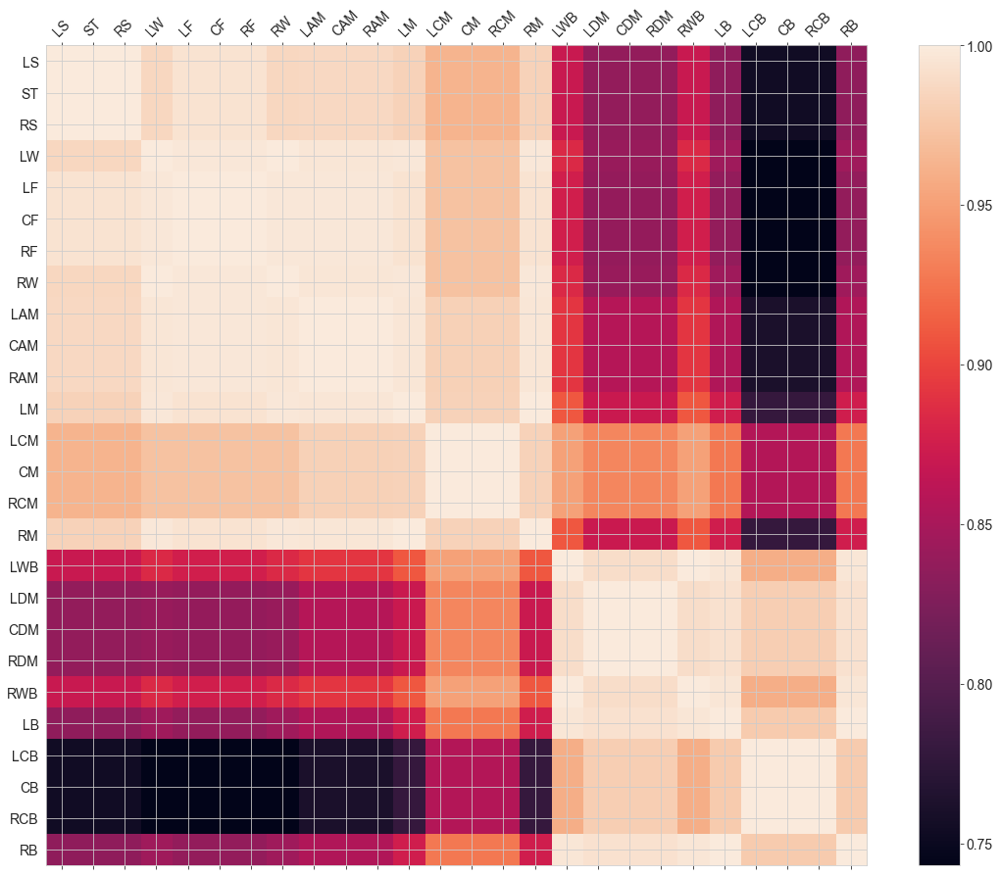

In [62]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df[colunas_habilidades_linha].corr(), fignum=f.number)
plt.xticks(
    range(df[colunas_habilidades_linha].shape[1]),
    df[colunas_habilidades_linha].columns,
    fontsize=14,
    rotation=45,
)
plt.yticks(
    range(df[colunas_habilidades_linha].shape[1]),
    df[colunas_habilidades_linha].columns,
    fontsize=14,
)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

#### Correlação entre colunas utilizadas na predição

In [63]:
df[colunas_predicao_posicao].corr()

,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height,Weight
Crossing,1.000000,0.655445,0.469579,0.809838,0.690417,0.856716,0.833251,0.761331,0.756569,0.841006,0.668509,0.645726,0.698586,0.389563,0.618297,0.705873,0.135571,0.672636,-0.029448,0.742232,0.473639,0.427783,0.783272,0.685058,0.646193,0.575466,0.443278,0.428954,0.409974,-0.663224,-0.660413,-0.659935,-0.660318,-0.662690,-0.486971,-0.393469
Finishing,0.655445,1.000000,0.473478,0.662078,0.882724,0.824390,0.759414,0.697784,0.512963,0.788455,0.606565,0.593997,0.644425,0.331580,0.523742,0.815714,0.097532,0.510880,-0.009503,0.877878,0.243145,-0.020481,0.888841,0.697439,0.837946,0.533555,0.024582,-0.032828,-0.071624,-0.588798,-0.587217,-0.583374,-0.584903,-0.586953,-0.370183,-0.292311
HeadingAccuracy,0.469579,0.473478,1.000000,0.640238,0.505759,0.550736,0.440917,0.407794,0.510912,0.658193,0.329840,0.379588,0.260667,0.325893,0.168883,0.611736,0.380146,0.634618,0.486947,0.506759,0.692888,0.548734,0.533830,0.275480,0.551954,0.507229,0.583267,0.561103,0.533643,-0.750489,-0.749951,-0.746505,-0.744488,-0.748931,0.012047,0.035892
ShortPassing,0.809838,0.662078,0.640238,1.000000,0.698470,0.843862,0.775549,0.736849,0.895679,0.911520,0.566191,0.555102,0.613399,0.483048,0.533350,0.771997,0.197643,0.716882,0.133638,0.761926,0.611756,0.543585,0.758032,0.713470,0.676389,0.685199,0.559946,0.541348,0.508813,-0.730174,-0.728503,-0.724790,-0.724190,-0.729095,-0.367068,-0.290645
Volleys,0.690417,0.882724,0.505759,0.698470,1.000000,0.809637,0.807275,0.749743,0.571071,0.794954,0.572192,0.557025,0.625068,0.393883,0.513613,0.832660,0.126228,0.527301,0.029615,0.868278,0.330437,0.088610,0.848336,0.699472,0.829509,0.595375,0.121251,0.072969,0.035662,-0.590872,-0.588802,-0.585081,-0.586218,-0.588753,-0.349441,-0.262859
Dribbling,0.856716,0.824390,0.550736,0.843862,0.809637,1.000000,0.842726,0.753737,0.722492,0.938977,0.748480,0.726953,0.765377,0.369368,0.663114,0.804929,0.143115,0.686475,-0.033614,0.843663,0.441250,0.296121,0.896940,0.730144,0.769778,0.597511,0.336319,0.301329,0.274031,-0.754693,-0.753300,-0.749911,-0.751403,-0.754388,-0.493698,-0.414244
Curve,0.833251,0.759414,0.440917,0.775549,0.807275,0.842726,1.000000,0.861291,0.710865,0.829612,0.607439,0.578795,0.682232,0.413500,0.587001,0.792215,0.111961,0.590297,-0.035836,0.835367,0.399503,0.273886,0.811186,0.744762,0.752091,0.616585,0.289706,0.261552,0.232997,-0.606376,-0.603302,-0.600392,-0.603661,-0.605083,-0.441126,-0.346100
FKAccuracy,0.761331,0.697784,0.407794,0.736849,0.749743,0.753737,0.861291,1.000000,0.703781,0.759623,0.498350,0.466797,0.590235,0.398412,0.521530,0.754406,0.082173,0.537452,-0.018996,0.802749,0.396202,0.295454,0.729707,0.717264,0.734545,0.585231,0.298024,0.279177,0.247981,-0.556642,-0.553716,-0.549931,-0.552688,-0.554977,-0.404861,-0.305317
LongPassing,0.756569,0.512963,0.510912,0.895679,0.571071,0.722492,0.710865,0.703781,1.000000,0.788662,0.442870,0.426881,0.523848,0.461479,0.462477,0.671647,0.154723,0.635755,0.114279,0.668004,0.590683,0.597053,0.614600,0.698163,0.542662,0.645833,0.587481,0.587650,0.562424,-0.597115,-0.595400,-0.591790,-0.591892,-0.596187,-0.331413,-0.261127
BallControl,0.841006,0.788455,0.658193,0.911520,0.794954,0.938977,0.829612,0.759623,0.788662,1.000000,0.676073,0.664260,0.704902,0.443814,0.600912,0.831360,0.195339,0.728624,0.087780,0.836074,0.550029,0.418762,0.863997,0.718332,0.769919,0.674884,0.452989,0.417686,0.384921,-0.788615,-0.787029,-0.783605,-0.783765,-0.788088,-0.416769,-0.337810


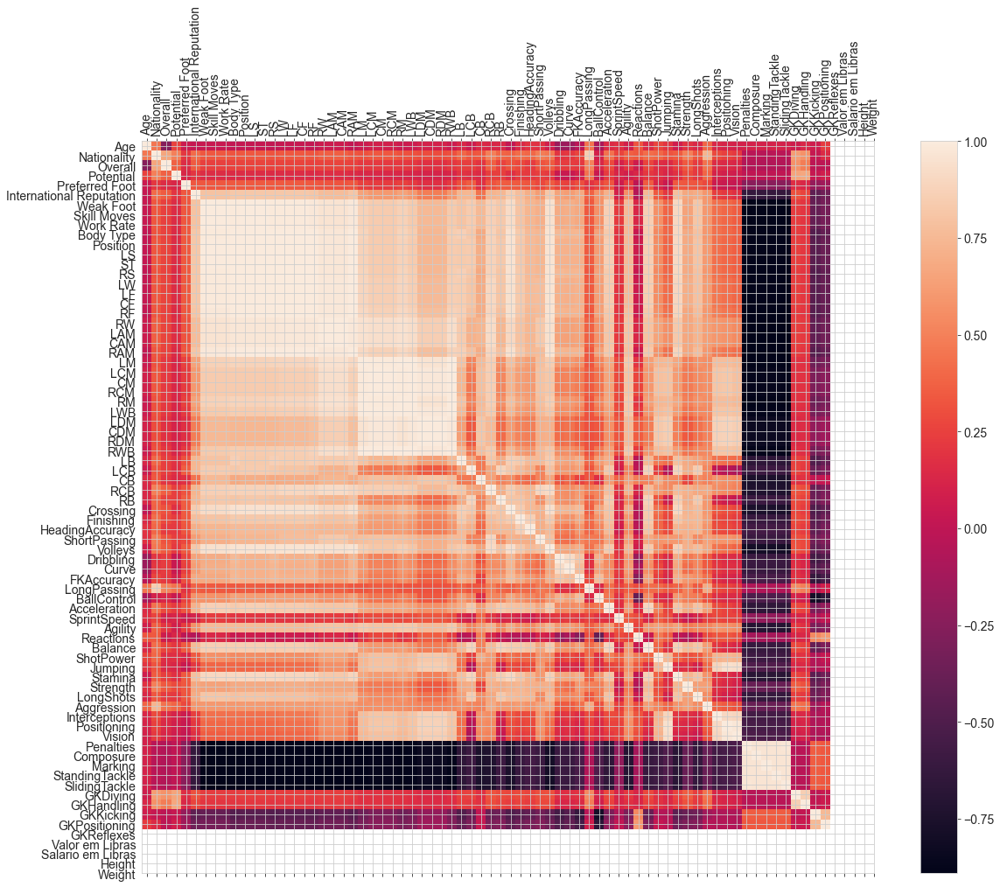

In [64]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df[colunas_predicao].corr(), fignum=f.number)
plt.xticks(
    range(df[colunas_predicao].shape[1]),
    df[colunas_predicao].columns,
    fontsize=14,
    rotation=90,
)
plt.yticks(
    range(df[colunas_predicao].shape[1]),
    df[colunas_predicao].columns,
    fontsize=14,
)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

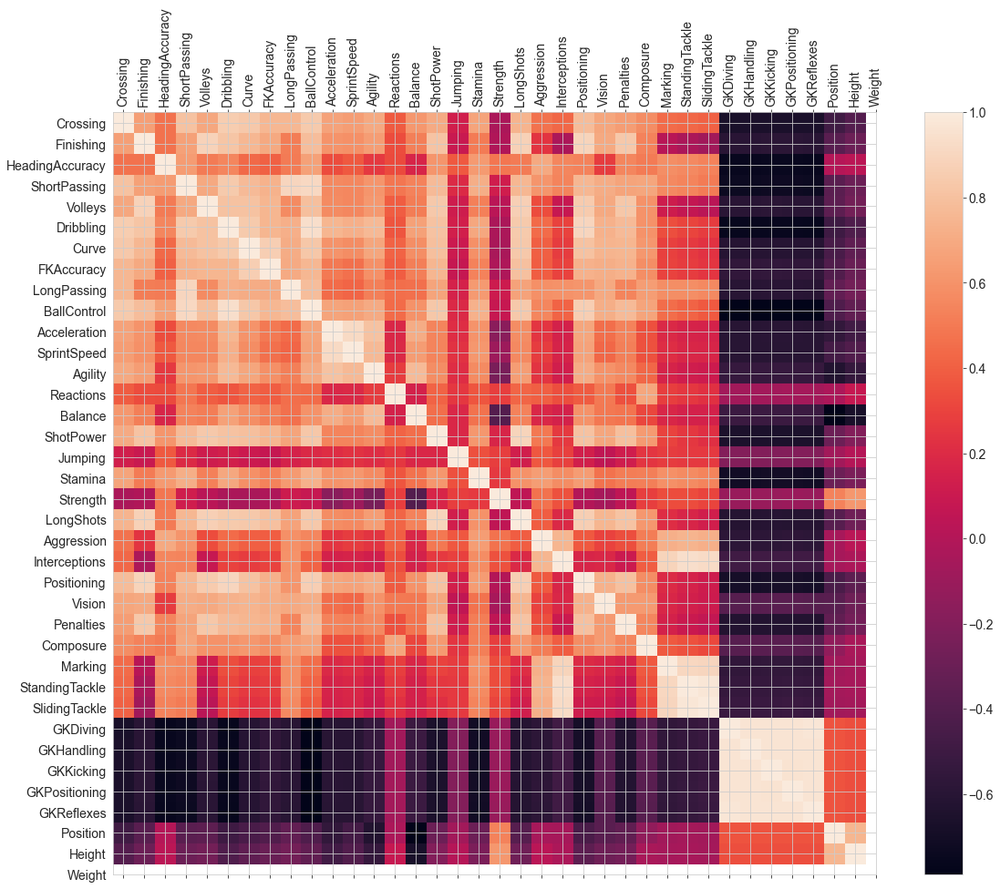

In [65]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df[colunas_predicao_posicao].corr(), fignum=f.number)
plt.xticks(
    range(df[colunas_predicao_posicao].shape[1]),
    df[colunas_predicao_posicao].columns,
    fontsize=14,
    rotation=90,
)
plt.yticks(
    range(df[colunas_predicao_posicao].shape[1]),
    df[colunas_predicao_posicao].columns,
    fontsize=14,
)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

## Criação dos Modelos

Não utilizo as colunas a seguir para predição: LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB.

O Objetivo é identificar a posição do jogador com base apenas nas habilidades futebolísticas.

### Posição do Jogador > RandomForestClassifier

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

In [66]:
features_list = [
    "Crossing",
    "Finishing",
    "HeadingAccuracy",
    "ShortPassing",
    "Volleys",
    "Dribbling",
    "Curve",
    "FKAccuracy",
    "LongPassing",
    "BallControl",
    "Acceleration",
    "SprintSpeed",
    "Agility",
    "Reactions",
    "Balance",
    "ShotPower",
    "Jumping",
    "Stamina",
    "Strength",
    "LongShots",
    "Aggression",
    "Interceptions",
    "Positioning",
    "Vision",
    "Penalties",
    "Composure",
    "Marking",
    "StandingTackle",
    "SlidingTackle",
    "GKDiving",
    "GKHandling",
    "GKKicking",
    "GKPositioning",
    "GKReflexes",
    "Height",
    "Weight",
]

features = np.array(df[features_list])

posicoes = np.array(df['Position'])

metricas = {}

# display(features)
# display(posicoes)

#### Divisão dos dados em dados de treinamento e teste

In [67]:
# Usando Skicit-learn para dividir os dados em treinamento e teste
from sklearn.model_selection import train_test_split

# Dividindo os dados em 75% treinamento e 25% teste
train_features, test_features, train_labels, test_labels = train_test_split(
    features, posicoes, test_size=0.25, random_state=42
)

In [68]:
print('Training Features Shape:', train_features.shape)
print('Training Labels Shape  :', train_labels.shape)
print('Testing Features Shape :', test_features.shape)
print('Testing Labels Shape   :', test_labels.shape)

Training Features Shape: (13610, 36)
Training Labels Shape  : (13610,)
Testing Features Shape : (4537, 36)
Testing Labels Shape   : (4537,)


In [69]:
# Importando RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Instanciando o modelo com 1000 árvores de decisão
# n_jobs = -1 (utiliza todos or processadores para agilizar o processamento)
rf = RandomForestClassifier(
    n_estimators=1000,  # Numero de Estimadores
    random_state=42,  # Seed Random
    n_jobs=-1,  # Utilizando todos os processadores
    criterion="entropy",  # Função pra medir a qualidade do split
    bootstrap=False,  # Utiliza todo o dataset
    verbose=0  # Verbosidade: 0 Off / 1 On
)

# Treinando o modelo
rf.fit(train_features, train_labels)

# Predizendo os valores com RFC
predictions = rf.predict(test_features)

#### Visualização da Árvore

In [70]:
# Importando os pacotes para gerar o gráfico
from sklearn.tree import export_graphviz
import pydot

# Escolhendo uma das árvores
tree = rf.estimators_[5]

# Gerando um arquivo dot
export_graphviz(tree, out_file = 'tree.dot', feature_names = features_list, rounded = True, precision = 1)

# Usando o arquivo dot para gerar um gráfico
(graph, ) = pydot.graph_from_dot_file('tree.dot')

# Convertendo o gráfico para PNG
graph.write_png('tree.png')

![Arvore](tree.png)

#### Matriz de Confusão

In [71]:
from sklearn.metrics import confusion_matrix
classes = ['D', 'F', 'GK', 'M']

def plota_matriz_completa(nome_modelo, test_labels, predictions):
    labels = ['D', 'F', 'GK', 'M']
    # Cria a Matriz de Confusão
    matrix = confusion_matrix(test_labels, predictions)
    # matrix

    # Monta o Plot
    plt.figure(figsize=(16,7))
    sns.set(font_scale=1.4)
    sns.heatmap(matrix, annot=True, annot_kws={'size':15},
                cmap=plt.cm.Blues, linewidths=0.2, fmt='g')

    # Adiciona as labels no plot
    class_names = labels
    tick_marks = np.arange(len(class_names))
    tick_marks2 = tick_marks + 0.5
    plt.xticks(tick_marks2, class_names, rotation=0)
    plt.yticks(tick_marks2, class_names, rotation=0)
    plt.xlabel('Valor Previsto')
    plt.ylabel('Valor Verdadeiro')
    plt.title(f'Matriz de Confusão da Previsão de Posições - {nome_modelo}')
    plt.show()

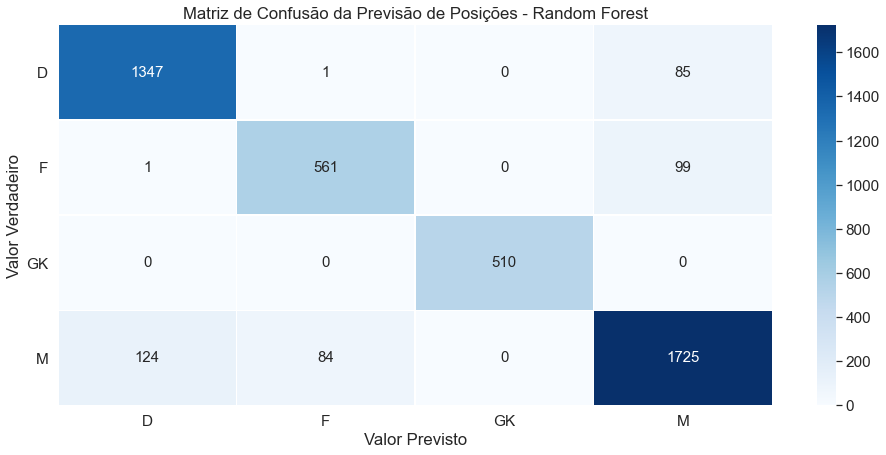

In [72]:
plota_matriz_completa('Random Forest', test_labels, predictions)

#### Relatório de Classificação

https://towardsdatascience.com/confusion-matrix-for-your-multi-class-machine-learning-model-ff9aa3bf7826

https://mineracaodedados.wordpress.com/tag/matriz-de-confusao/

https://www.youtube.com/watch?v=FAr2GmWNbT0

**SENSIBILIDADE** -> Recall

- 'sensitivity' = 'true_positive_rate': TP/P = TP/(FN + TP)

A proporção de verdadeiros positivos: a capacidade do sistema em predizer corretamente a condição para casos que realmente a têm.

SENSIBILIDADE = ACERTOS POSITIVOS / TOTAL DE POSITIVOS  
SENSIBILIDADE = VP / (VP + FN)

**ESPECIFICIDADE** -> True Negative Rate

- 'specificity' = 'true_negative_rate': TN/N = TN/(FP + TN)

A proporção de verdadeiros negativos: a capacidade do sistema em predizer corretamente a ausência da condição para casos que realmente não a têm.

ESPECIFICIDADE = ACERTOS NEGATIVOS / TOTAL DE NEGATIVOS  
ESPECIFICIDADE = VN / (VN + FP)

In [73]:
from sklearn.metrics import classification_report

class_names = classes

print(
    classification_report(test_labels, predictions, target_names=class_names, digits=4)
)

              precision    recall  f1-score   support

           D     0.9151    0.9400    0.9274      1433
           F     0.8684    0.8487    0.8585       661
          GK     1.0000    1.0000    1.0000       510
           M     0.9036    0.8924    0.8980      1933

    accuracy                         0.9132      4537
   macro avg     0.9218    0.9203    0.9209      4537
weighted avg     0.9129    0.9132    0.9130      4537



In [74]:
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def calcula_score(valores_teste, valores_previstos):
    multimatrix = multilabel_confusion_matrix(
        valores_teste, valores_previstos, labels=["D", "F", "GK", "M"]
    )
    
    print('Acuracia Total:', accuracy_score(valores_teste, valores_previstos))
    print()

    for i, classe in enumerate(class_names):
        VN = multimatrix[i][0][0]
        FP = multimatrix[i][0][1]
        FN = multimatrix[i][1][0]
        VP = multimatrix[i][1][1]
        # print(multimatrix[i])
        # print('VP', VP)
        # print('VN', VN)
        # print('FP', FP)
        # print('FN', FN)
        sensibilidade = VP / (VP + FN)
        especificidade = VN / (VN + FP)
        print("-- Classe", classe)
        print("Sensibilidade :", round(sensibilidade, 3))
        print("Especificidade:", round(especificidade, 3))
        print("")
        
calcula_score(test_labels, predictions)

Acuracia Total: 0.9131584747630593

-- Classe D
Sensibilidade : 0.94
Especificidade: 0.96

-- Classe F
Sensibilidade : 0.849
Especificidade: 0.978

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.892
Especificidade: 0.929



In [75]:
multilabel_confusion_matrix(
        test_labels, predictions, labels=["D", "F", "GK", "M"]
    )

array([[[2979,  125],
        [  86, 1347]],

       [[3791,   85],
        [ 100,  561]],

       [[4027,    0],
        [   0,  510]],

       [[2420,  184],
        [ 208, 1725]]])

#### Importância das Features

In [76]:
# Get numerical feature importances
importances = list(rf.feature_importances_)

# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 3))
    for feature, importance in zip(features_list, importances)
]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

# Print out the feature and importances
for pair in feature_importances:
    print("Variable: {:20} Importance: {}".format(*pair))

Variable: SlidingTackle        Importance: 0.111
Variable: StandingTackle       Importance: 0.094
Variable: Finishing            Importance: 0.053
Variable: Interceptions        Importance: 0.05
Variable: HeadingAccuracy      Importance: 0.047
Variable: GKDiving             Importance: 0.044
Variable: GKPositioning        Importance: 0.043
Variable: Vision               Importance: 0.042
Variable: GKHandling           Importance: 0.041
Variable: GKReflexes           Importance: 0.039
Variable: Marking              Importance: 0.038
Variable: Crossing             Importance: 0.037
Variable: LongPassing          Importance: 0.031
Variable: Positioning          Importance: 0.03
Variable: LongShots            Importance: 0.029
Variable: Volleys              Importance: 0.027
Variable: GKKicking            Importance: 0.027
Variable: Dribbling            Importance: 0.023
Variable: ShortPassing         Importance: 0.019
Variable: BallControl          Importance: 0.016
Variable: Strength    

### Posição do Jogador > SVC

https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html

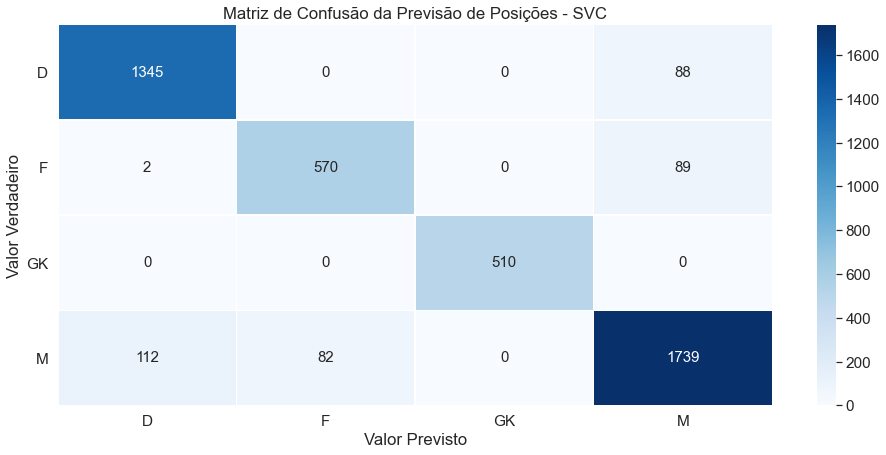

Acuracia Total: 0.9177870839761957

-- Classe D
Sensibilidade : 0.939
Especificidade: 0.963

-- Classe F
Sensibilidade : 0.862
Especificidade: 0.979

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.9
Especificidade: 0.932



In [77]:
from sklearn.svm import SVC

svcc = SVC()
svcc.fit(train_features, train_labels)

svc_predictions = svcc.predict(test_features)

plota_matriz_completa('SVC', test_labels, svc_predictions)

calcula_score(test_labels, svc_predictions)

### Posição do Jogador > Regressão Logística Multinomial

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

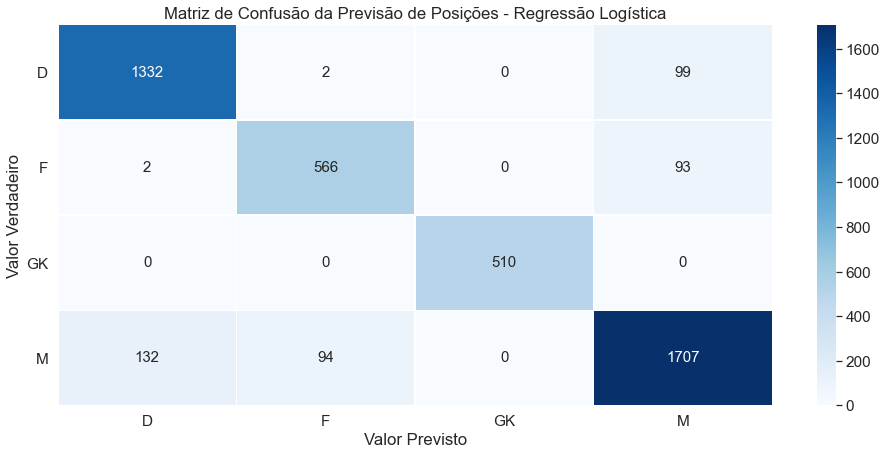

Acuracia Total: 0.9069869958122108

-- Classe D
Sensibilidade : 0.93
Especificidade: 0.957

-- Classe F
Sensibilidade : 0.856
Especificidade: 0.975

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.883
Especificidade: 0.926



In [78]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(multi_class="multinomial", solver="newton-cg")

lr.fit(train_features, train_labels)

lr_predictions = lr.predict(test_features)

plota_matriz_completa('Regressão Logística', test_labels, lr_predictions)

calcula_score(test_labels, lr_predictions)

### Posição do Jogador > GradientBoostingClassifier

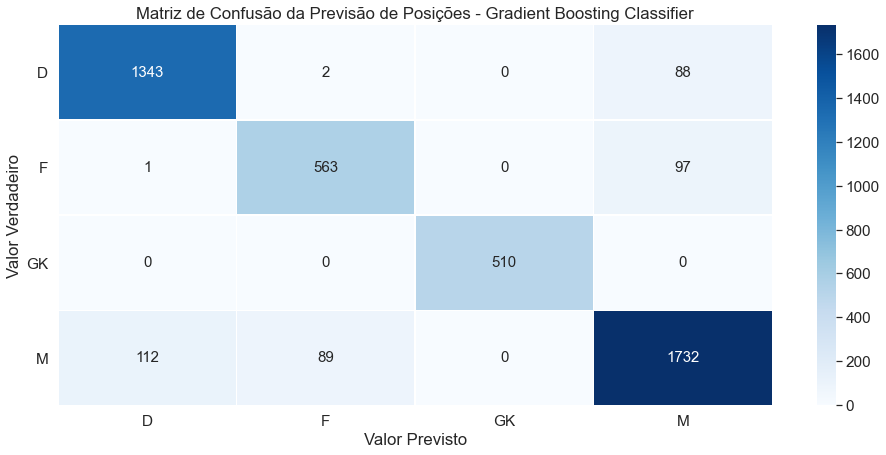

Acuracia Total: 0.9142605245757108

-- Classe D
Sensibilidade : 0.937
Especificidade: 0.964

-- Classe F
Sensibilidade : 0.852
Especificidade: 0.977

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.896
Especificidade: 0.929



In [79]:
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

gbc = GradientBoostingClassifier()

gbc.fit(train_features, train_labels)

gbc_predictions = gbc.predict(test_features)

plota_matriz_completa('Gradient Boosting Classifier', test_labels, gbc_predictions)

calcula_score(test_labels, gbc_predictions)

### Posição do Jogador > KNN

https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

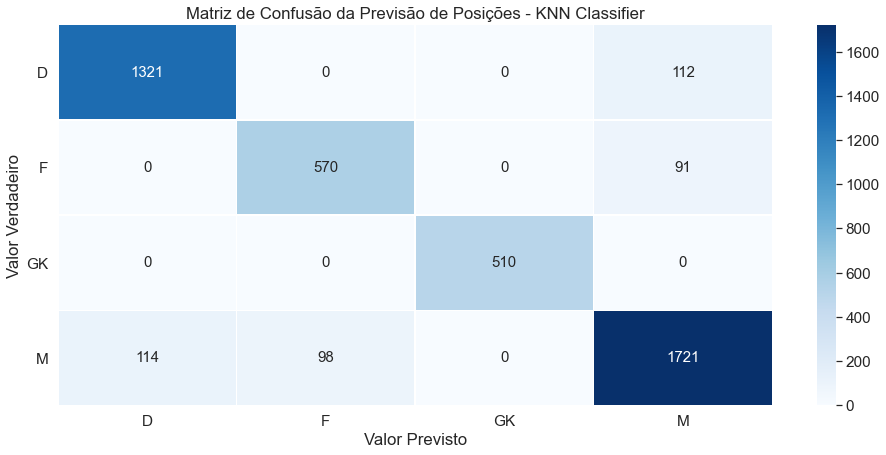

Acuracia Total: 0.9085298655499229

-- Classe D
Sensibilidade : 0.922
Especificidade: 0.963

-- Classe F
Sensibilidade : 0.862
Especificidade: 0.975

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.89
Especificidade: 0.922



In [80]:
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

knn_model = KNeighborsClassifier()

# create a dictionary of all values we want to test for n_neighbors
param_grid = {'n_neighbors': np.arange(1, 25)}

# use gridsearch to test all values for n_neighbors
KNN = GridSearchCV(knn_model, param_grid, cv=5, n_jobs=-1)

KNN.fit(train_features, train_labels)

knn_predictions = KNN.predict(test_features)

plota_matriz_completa('KNN Classifier', test_labels, knn_predictions)

calcula_score(test_labels, knn_predictions)

### Posição do Jogador > Ensenble VotingClassifier

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingClassifier.html

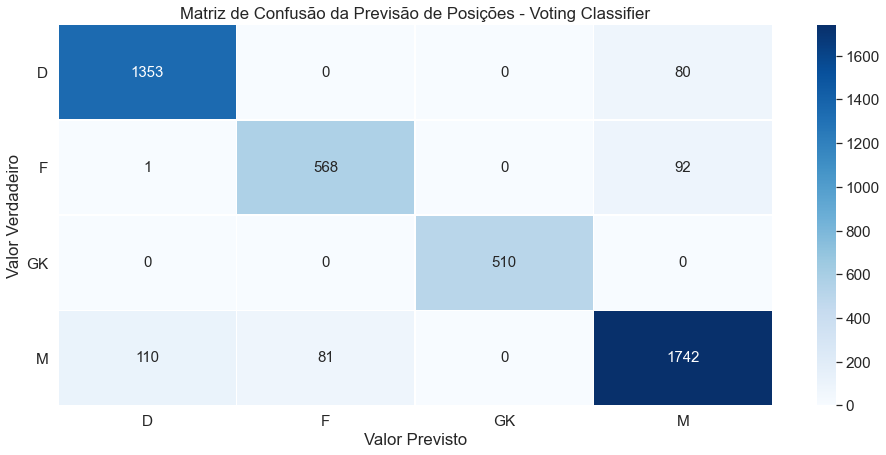

Acuracia Total: 0.9197707736389685

-- Classe D
Sensibilidade : 0.944
Especificidade: 0.964

-- Classe F
Sensibilidade : 0.859
Especificidade: 0.979

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.901
Especificidade: 0.934



In [81]:
from sklearn.ensemble import VotingClassifier

voting_clf = VotingClassifier(
    estimators=[('lr', lr), ('rf', rf), ('svc', svcc), ('gbc', gbc), ('knn', KNN)],
    voting='hard'
)

voting_clf.fit(train_features, train_labels)

voting_predictions = voting_clf.predict(test_features)

plota_matriz_completa('Voting Classifier', test_labels, voting_predictions)

calcula_score(test_labels, voting_predictions)

Acurácia dos Modelos:

-- LogisticRegression
- Treinamento do Modelo
CPU times: user 35.1 s, sys: 6.46 s, total: 41.6 s
Wall time: 12.4 s
- Predição de Valores
CPU times: user 5.15 ms, sys: 1.61 ms, total: 6.76 ms
Wall time: 1.64 ms


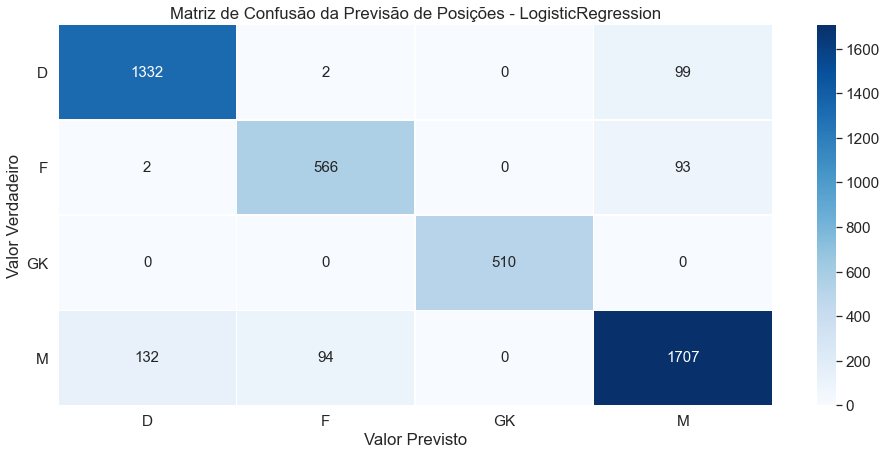

Acuracia Total: 0.9069869958122108

-- Classe D
Sensibilidade : 0.93
Especificidade: 0.957

-- Classe F
Sensibilidade : 0.856
Especificidade: 0.975

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.883
Especificidade: 0.926

----------
-- RandomForestClassifier
- Treinamento do Modelo
CPU times: user 1min 20s, sys: 1.55 s, total: 1min 21s
Wall time: 14.8 s
- Predição de Valores
CPU times: user 1.4 s, sys: 210 ms, total: 1.61 s
Wall time: 577 ms


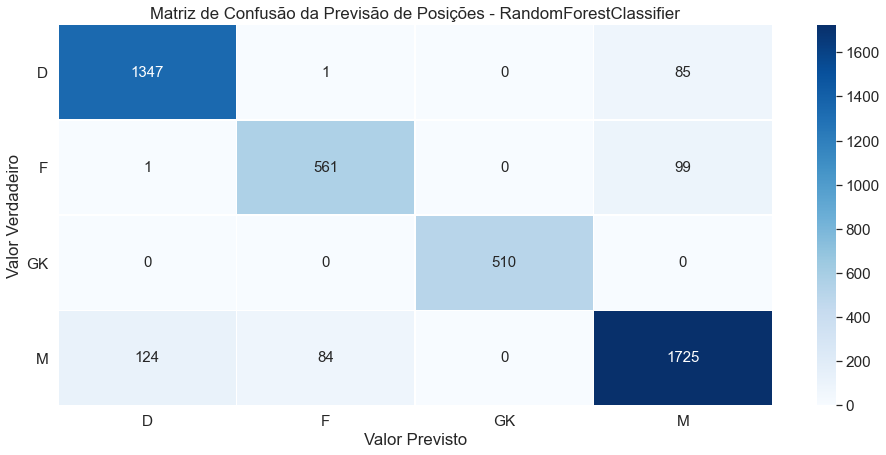

Acuracia Total: 0.9131584747630593

-- Classe D
Sensibilidade : 0.94
Especificidade: 0.96

-- Classe F
Sensibilidade : 0.849
Especificidade: 0.978

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.892
Especificidade: 0.929

----------
-- GradientBoostingClassifier
- Treinamento do Modelo
CPU times: user 25.6 s, sys: 612 ms, total: 26.2 s
Wall time: 27.4 s
- Predição de Valores
CPU times: user 34.3 ms, sys: 3.85 ms, total: 38.1 ms
Wall time: 37.6 ms


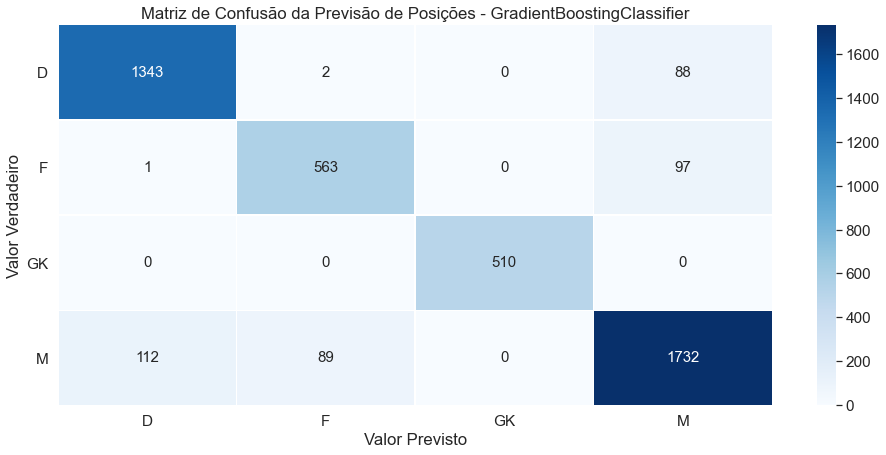

Acuracia Total: 0.9142605245757108

-- Classe D
Sensibilidade : 0.937
Especificidade: 0.964

-- Classe F
Sensibilidade : 0.852
Especificidade: 0.977

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.896
Especificidade: 0.929

----------
-- SVC
- Treinamento do Modelo
CPU times: user 2.83 s, sys: 256 ms, total: 3.08 s
Wall time: 3.6 s
- Predição de Valores
CPU times: user 890 ms, sys: 13.7 ms, total: 903 ms
Wall time: 912 ms


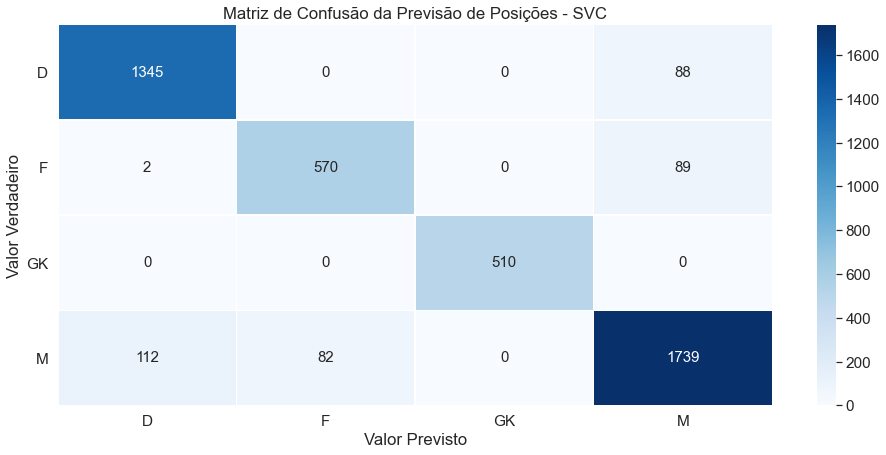

Acuracia Total: 0.9177870839761957

-- Classe D
Sensibilidade : 0.939
Especificidade: 0.963

-- Classe F
Sensibilidade : 0.862
Especificidade: 0.979

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.9
Especificidade: 0.932

----------
-- VotingClassifier
- Treinamento do Modelo
CPU times: user 1min 3s, sys: 8.07 s, total: 1min 11s
Wall time: 1min 56s
- Predição de Valores
CPU times: user 6.52 s, sys: 888 ms, total: 7.41 s
Wall time: 6.19 s


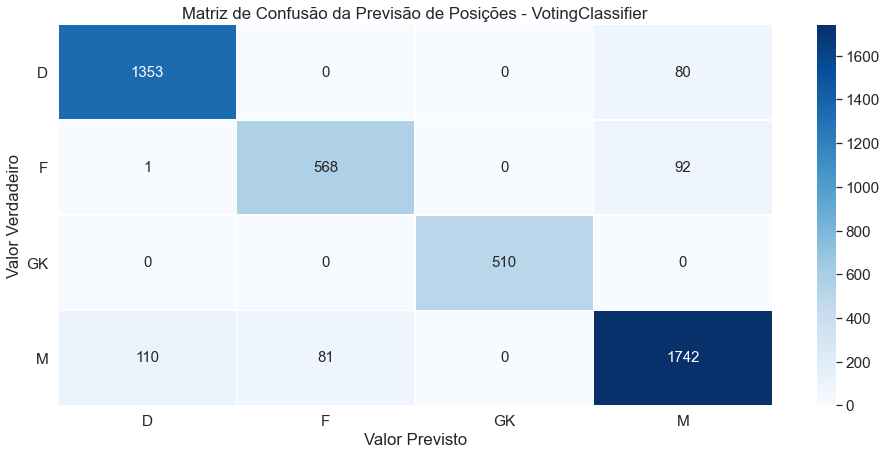

Acuracia Total: 0.9197707736389685

-- Classe D
Sensibilidade : 0.944
Especificidade: 0.964

-- Classe F
Sensibilidade : 0.859
Especificidade: 0.979

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.901
Especificidade: 0.934

----------
-- GridSearchCV
- Treinamento do Modelo
CPU times: user 497 ms, sys: 71.2 ms, total: 568 ms
Wall time: 1min 5s
- Predição de Valores
CPU times: user 3.58 s, sys: 54.4 ms, total: 3.63 s
Wall time: 3.68 s


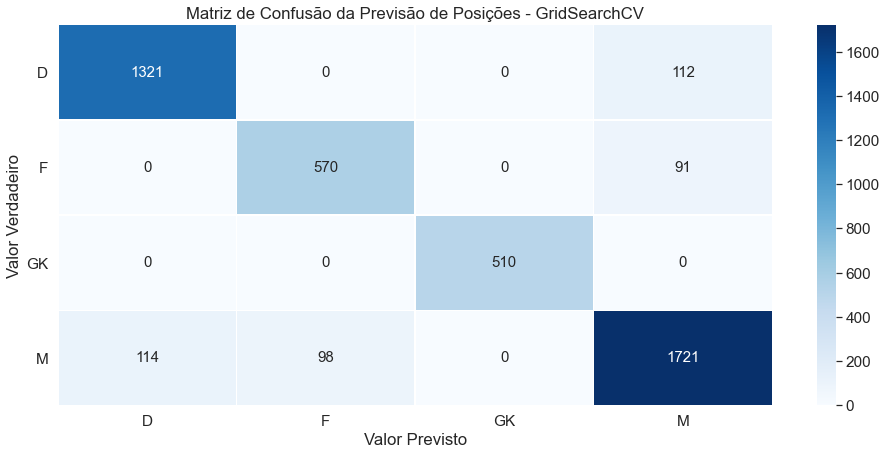

Acuracia Total: 0.9085298655499229

-- Classe D
Sensibilidade : 0.922
Especificidade: 0.963

-- Classe F
Sensibilidade : 0.862
Especificidade: 0.975

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.89
Especificidade: 0.922

----------


In [82]:
print('Acurácia dos Modelos:\n')

for clf in (lr, rf, gbc, svcc, voting_clf, KNN):
    print('--', clf.__class__.__name__)
    
    print('- Treinamento do Modelo')
    %time clf.fit(train_features, train_labels)
    print('- Predição de Valores')
    %time pred = clf.predict(test_features)
    # print(round(accuracy_score(test_labels, pred),4),'\t',clf.__class__.__name__)
    plota_matriz_completa(clf.__class__.__name__, test_labels, pred)
    calcula_score(test_labels, pred)
    print('-'*10)

## Comparação entre os Algorítmos

### Acurácia

In [83]:
from sklearn import model_selection

models = [
    ('Regressao Logistica', lr), 
    ('RandomForest', rf), 
    ('GBC', gbc), 
    ('SVC', svcc), 
    ('KNN', KNN), 
    ('Voting', voting_clf)
]
results = []
names = []
scoring = 'accuracy'

for name, model in models:
    print('Iniciando treinamento', name)
    kfold = model_selection.KFold(n_splits=10, random_state=42)
    cv_results = model_selection.cross_val_score(model, train_features, train_labels, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

Iniciando treinamento Regressao Logistica
Regressao Logistica: 0.904555 (0.007329)
Iniciando treinamento RandomForest
RandomForest: 0.910801 (0.009006)
Iniciando treinamento GBC
GBC: 0.909037 (0.006521)
Iniciando treinamento SVC
SVC: 0.911021 (0.008483)
Iniciando treinamento KNN
KNN: 0.904482 (0.005878)
Iniciando treinamento Voting
Voting: 0.912050 (0.008287)


In [87]:
results

[array([0.90301249, 0.90595151, 0.88611315, 0.90374724, 0.90668626,
        0.90521675, 0.90815577, 0.9140338 , 0.91256429, 0.90007348]),
 array([0.9140338 , 0.91182954, 0.89346069, 0.89639971, 0.91182954,
        0.90889052, 0.92285084, 0.91844232, 0.91991183, 0.91036003]),
 array([0.91476855, 0.91109478, 0.8949302 , 0.90301249, 0.91036003,
        0.90889052, 0.90889052, 0.91550331, 0.91844232, 0.904482  ]),
 array([0.91623806, 0.91036003, 0.89639971, 0.90227774, 0.90742101,
        0.90742101, 0.91991183, 0.92285084, 0.92211609, 0.90521675]),
 array([0.90668626, 0.90301249, 0.89860397, 0.89566495, 0.90595151,
        0.90227774, 0.91036003, 0.91550331, 0.90889052, 0.89786921]),
 array([0.91550331, 0.91623806, 0.89713446, 0.90301249, 0.90962528,
        0.91182954, 0.92285084, 0.92138134, 0.91991183, 0.90301249])]

In [88]:
names

['Regressao Logistica', 'RandomForest', 'GBC', 'SVC', 'KNN', 'Voting']

Por essa análise, eu escolheria o Algoritmo de `Voting` para a predição dos meus dados, pois é o que apresenta a melhor mediana. Mas pelo custo de treinamento e predição, `Random Forest` e `SVC` também são bons candidatos.

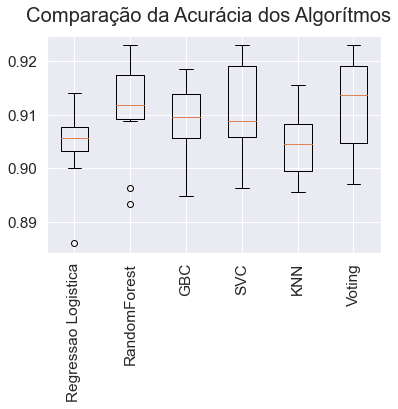

In [84]:
fig = plt.figure()
fig.suptitle('Comparação da Acurácia dos Algorítmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

## Futuros Desenvolvimentos

- Fazer o Scrap de uma base atualizada.
- Executar alguns algorítmos de redução de dimensionalidade.

## Outras Referências

- https://www.kaggle.com/ap1495/fifa-19-classification-regression
- https://www.kaggle.com/isaienkov/eda-simple-modeling-football-field-visualization
- https://medium.com/analytics-vidhya/evaluating-a-random-forest-model-9d165595ad56
- https://towardsdatascience.com/random-forest-in-python-24d0893d51c0


Gerando dados para WEKA

In [85]:
import arff

arff.dump("fifa2019.arff", df.values, relation="jogadores fifa 2019", names=df.columns)

Treinando modelo com menos features, para analizar Acurácia

In [86]:
atributos_importantes = [
    'Finishing',
    'HeadingAccuracy',
    'Volleys',
    'FKAccuracy',
    'LongPassing',
    'Balance',
    'LongShots',
    'Interceptions',
    'Positioning',
    'Vision',
    'Penalties',
    'Marking',
    'StandingTackle',
    'SlidingTackle',
    'GKDiving',
    'GKHandling',
    'GKKicking',
    'GKPositioning'
]

features_menor = np.array(df[features_list])

posicoes_menor = np.array(df['Position'])

train_features_m, test_features_m, train_labels_m, test_labels_m = train_test_split(
    features, posicoes, test_size=0.25, random_state=42
)

# Modelos

rf_m = RandomForestClassifier(
    n_estimators=1000,  # Numero de Estimadores
    random_state=42,  # Seed Random
    n_jobs=-1,  # Utilizando todos os processadores
    criterion="entropy",  # Função pra medir a qualidade do split
    bootstrap=False,  # Utiliza todo o dataset
    verbose=0  # Verbosidade: 0 Off / 1 On
)

svcc_m = SVC()

lr_m = LogisticRegression(multi_class="multinomial", solver="newton-cg")

gbc_m = GradientBoostingClassifier()

knn_model_m = KNeighborsClassifier()

param_grid_m = {'n_neighbors': np.arange(1, 25)}

KNN_m = GridSearchCV(knn_model_m, param_grid_m, cv=5, n_jobs=-1)

# Voting
voting_clf_m = VotingClassifier(
    estimators=[('lr', lr_m), ('rf', rf_m), ('svc', svcc_m), ('gbc', gbc_m), ('knn', KNN_m)],
    voting='hard'
)

voting_clf_m.fit(train_features_m, train_labels_m)

print('Acurácia dos Modelos:\n')

for clf in (lr_m, rf_m, gbc_m, svcc_m, KNN_m, voting_clf_m):
    print('--', clf.__class__.__name__)
    
    print('- Treinamento do Modelo')
    %time clf.fit(train_features_m, train_labels_m)
    print('- Predição de Valores')
    %time pred_m = clf.predict(test_features_m)
    # print(round(accuracy_score(test_labels, pred),4),'\t',clf.__class__.__name__)

    calcula_score(test_labels_m, pred_m)
    print('-'*10)

Acurácia dos Modelos:

-- LogisticRegression
- Treinamento do Modelo
CPU times: user 30.9 s, sys: 3.47 s, total: 34.4 s
Wall time: 8.85 s
- Predição de Valores
CPU times: user 8.04 ms, sys: 5.3 ms, total: 13.3 ms
Wall time: 3.31 ms
Acuracia Total: 0.9069869958122108

-- Classe D
Sensibilidade : 0.93
Especificidade: 0.957

-- Classe F
Sensibilidade : 0.856
Especificidade: 0.975

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.883
Especificidade: 0.926

----------
-- RandomForestClassifier
- Treinamento do Modelo
CPU times: user 1min 15s, sys: 1.35 s, total: 1min 17s
Wall time: 12.8 s
- Predição de Valores
CPU times: user 1.29 s, sys: 167 ms, total: 1.46 s
Wall time: 512 ms
Acuracia Total: 0.9131584747630593

-- Classe D
Sensibilidade : 0.94
Especificidade: 0.96

-- Classe F
Sensibilidade : 0.849
Especificidade: 0.978

-- Classe GK
Sensibilidade : 1.0
Especificidade: 1.0

-- Classe M
Sensibilidade : 0.892
Especificidade: 0.929

----------
-- GradientBo